In [1]:
import numpy as np
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
%matplotlib inline

In [3]:
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (16, 9)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['font.family'] = 'monospace'

In [4]:
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['savefig.pad_inches'] = 0.5

In [5]:
# Get the MNIST data
df = pd.read_csv('../data/mnist_train.csv', header=0, low_memory=False)

In [6]:
dftest = pd.read_csv('../data/mnist_test.csv', header=0, low_memory=False)

In [7]:
df.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x775,x776,x777,x778,x779,x780,x781,x782,x783,x784
0,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
#df['num'] = df['num'].astype('category')

In [9]:
dftest['intensity'] = dftest.ix[:,1:785].mean(axis = 1)/255

In [10]:
# Calculate Intensity Features
df['intensity'] = df.ix[:,1:785].mean(axis = 1)/255
df.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x776,x777,x778,x779,x780,x781,x782,x783,x784,intensity
0,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.108398
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.164601
2,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.151251
3,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.135649
4,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.086405


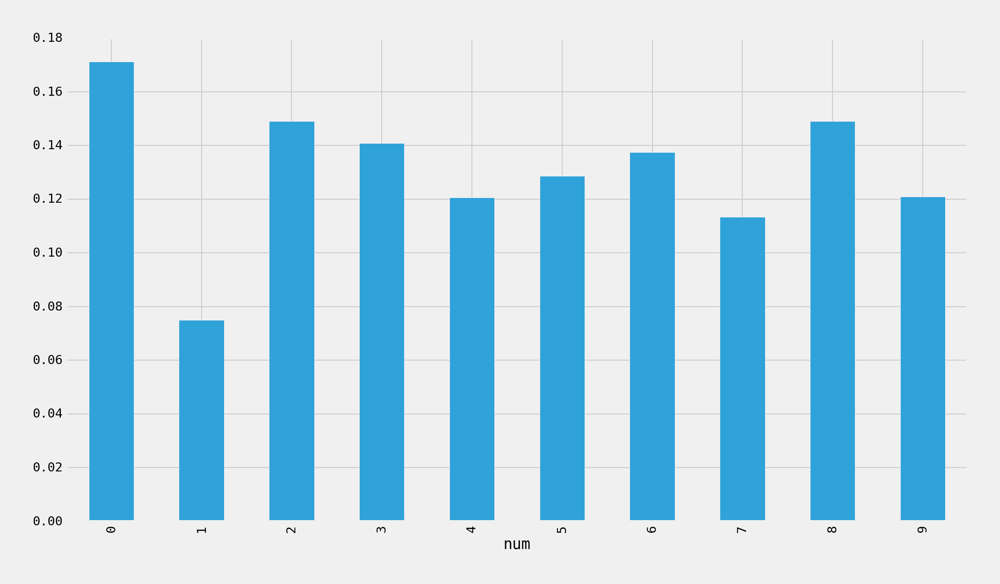

In [11]:
intensity_avg = df.groupby('num')['intensity'].mean()
intensity_avg.head()
intensity_avg.plot(kind = 'bar')

In [12]:
# Calculate Symmetry Features
def symmetry(arr1D):
    pixels = np.array(arr1D, dtype = 'uint8')
    pixels = pixels.reshape(28,28)
    # Flip Left to Right
    pixelslr = np.fliplr(pixels)
    # Flip Up to Down
    pixelsud = np.flipud(pixels)
    sym_matrix = (np.abs(pixels - pixelslr) + np.abs(pixels - pixelsud))/2
    sym = np.mean(sym_matrix) / 255
    return sym

In [13]:
dftest['symmetry'] = df.ix[:,1:785].apply(symmetry, axis = 1)

In [14]:
df['symmetry'] = df.ix[:,1:785].apply(symmetry, axis = 1)
df.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x777,x778,x779,x780,x781,x782,x783,x784,intensity,symmetry
0,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.108398,0.075550
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.164601,0.090276
2,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.151251,0.085154
3,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.135649,0.081953
4,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.086405,0.079392


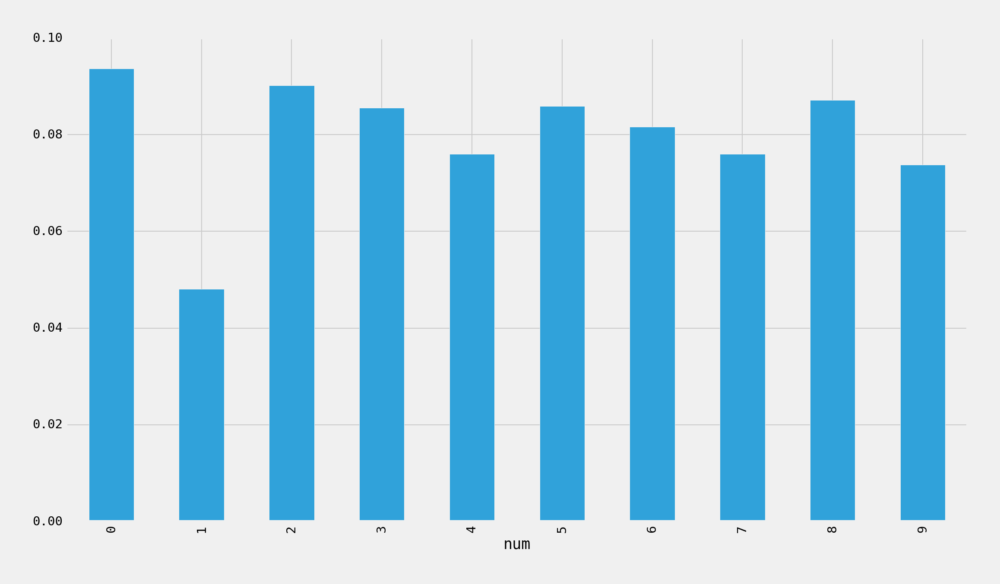

In [15]:
symmetry_avg = df.groupby('num')['symmetry'].mean()
symmetry_avg.head()
symmetry_avg.plot(kind = 'bar')

In [16]:
df1 = df[df.num == 1]
df2 = df[df.num == 2]

In [17]:
df1.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x777,x778,x779,x780,x781,x782,x783,x784,intensity,symmetry
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.075895,0.059544
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.089421,0.056343
22,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.055102,0.043537
26,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.074460,0.037135
33,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.080202,0.055702


In [18]:
df2.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x777,x778,x779,x780,x781,x782,x783,x784,intensity,symmetry
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.164601,0.090276
23,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.133839,0.094758
50,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.127561,0.075550
60,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.123419,0.085794
62,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.127311,0.087715


In [19]:
# Plot a particular MNIST data
def plotDigit(arr1D, label):
    #arr1D = df.ix[id, 1:785]
    #label = df.ix[id, 0]
    pixels = np.array(arr1D, dtype='uint8')
    # Reshape the array into 28 x 28 array (2-dimensional array)
    pixels = pixels.reshape((28, 28))
    # Plot
    fig = plt.figure()
    ax = fig.add_subplot(1,1,1)
    imgplot = ax.imshow(pixels, cmap='gray')
    imgplot.set_interpolation('nearest')
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    plt.xticks(np.arange(0, 28, 1))
    plt.yticks(np.arange(0, 28, 1))
    #plt.title('Label is {label}'.format(label=label))
    plt.grid(which='major', color=(0.25,0.25,0.25))

In [20]:
plt.rcParams['figure.figsize'] = (9, 9)

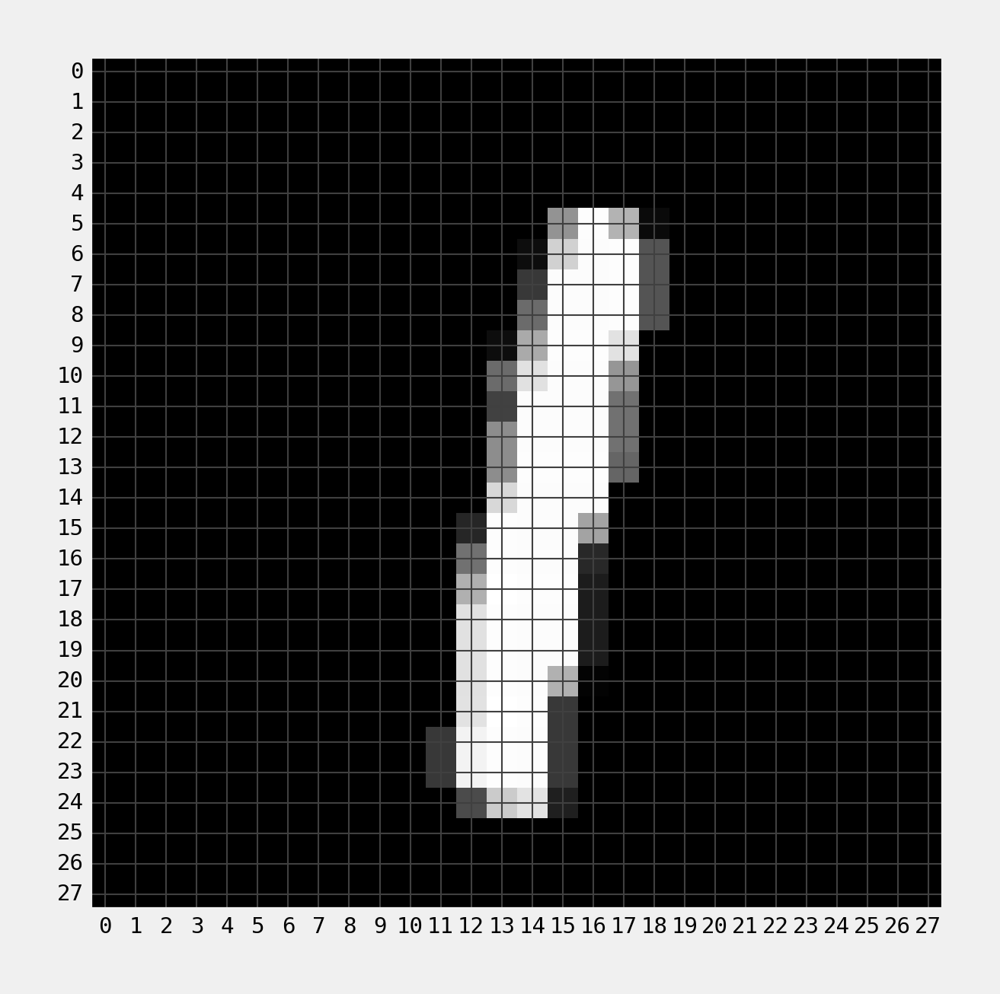

In [21]:
plotDigit(df.ix[10, 1:785], df.ix[10, 0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00a.png", facecolor = "black")

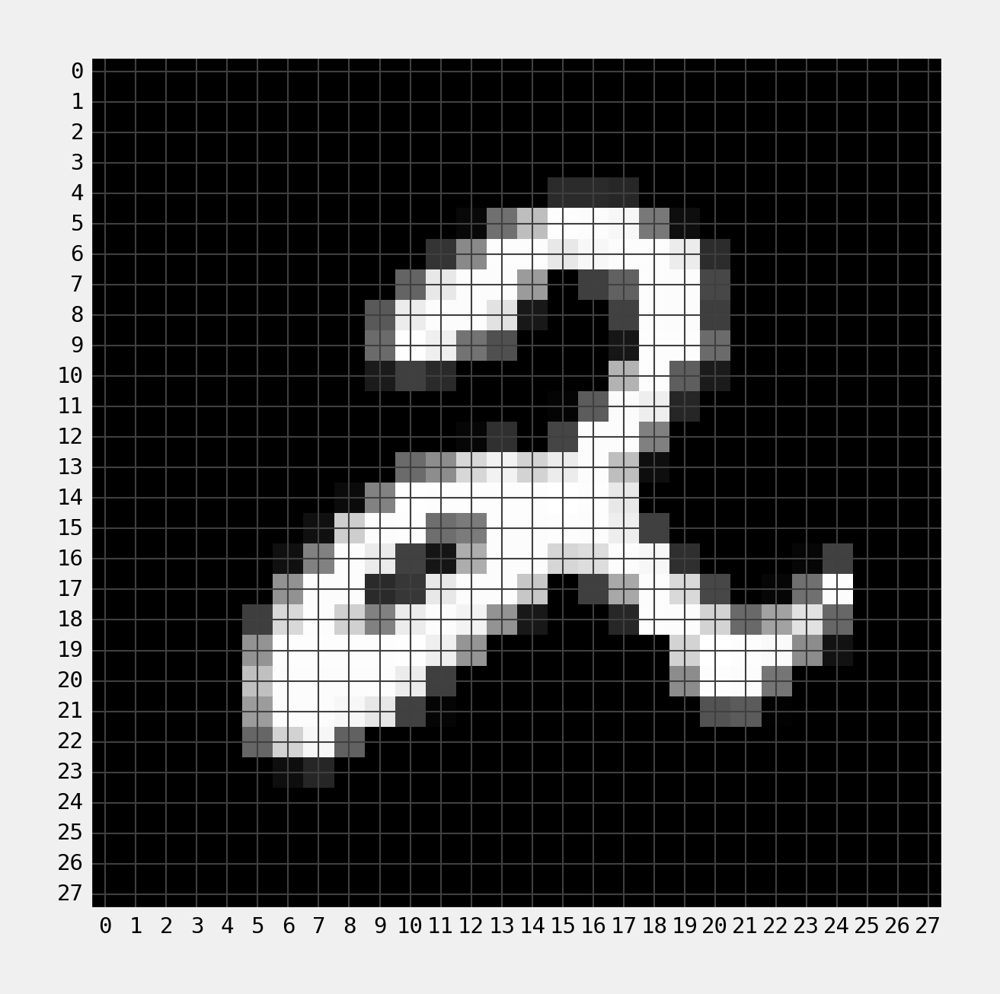

In [22]:
plotDigit(df.ix[63, 1:785], df.ix[63, 0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00b.png", facecolor = "black")

## [0] Visualise the Data Space

In [23]:
df1.shape

(2727, 787)

In [24]:
df2.shape

(2507, 787)

In [25]:
df1Avg = df1.ix[:,:].mean(axis = 0)
df2Avg = df2.ix[:,:].mean(axis = 0)

In [26]:
df1Avg[0]

1.0

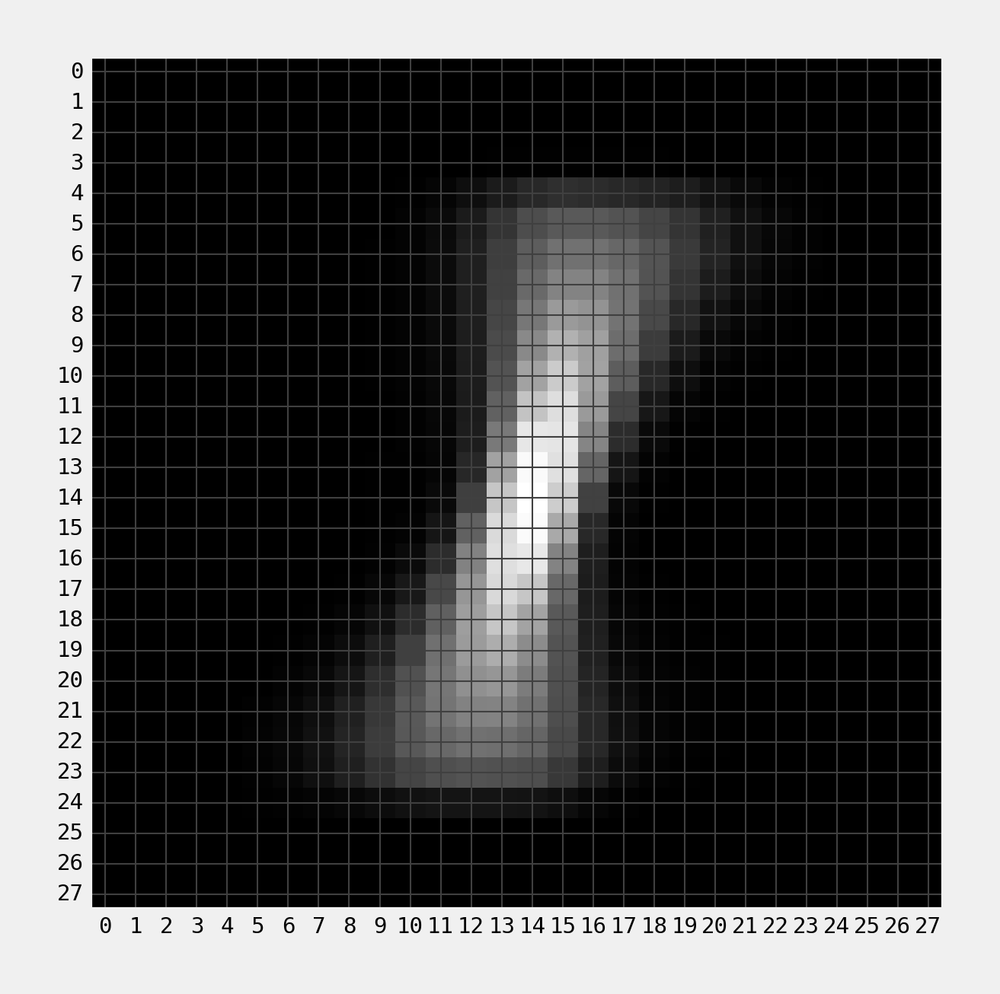

In [27]:
plotDigit(df1Avg[1:785], df1Avg[0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00c.png",  facecolor = "black")

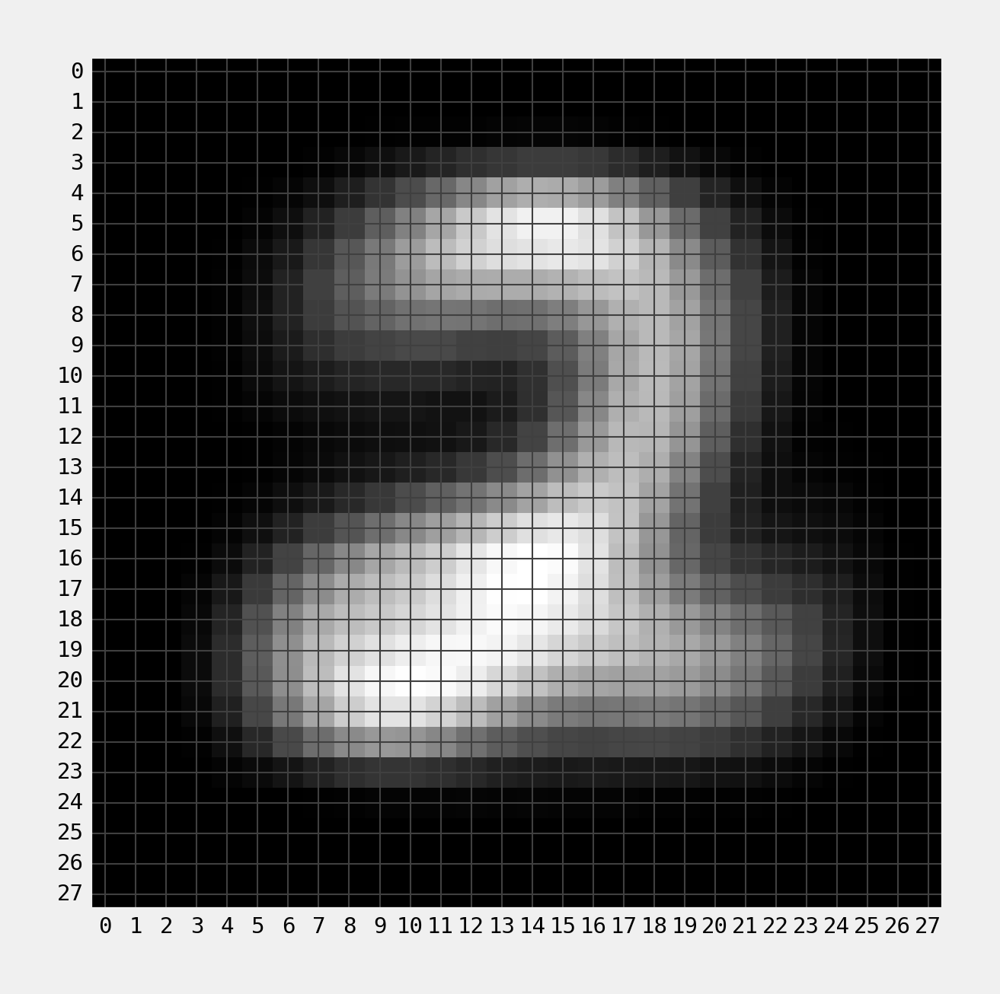

In [28]:
plotDigit(df2Avg[1:785], df2Avg[0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00d.png",  facecolor = "black")

In [29]:
# Plot a particular MNIST data with abline
def plotDigitLine(arr1D, label):
    #arr1D = df.ix[id, 1:785]
    #label = df.ix[id, 0]
    pixels = np.array(arr1D, dtype='uint8')
    # Reshape the array into 28 x 28 array (2-dimensional array)
    pixels = pixels.reshape((28, 28))
    # Plot
    fig = plt.figure()
    ax = fig.add_subplot(1,1,1)
    imgplot = ax.imshow(pixels, cmap='gray')
    imgplot.set_interpolation('nearest')
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')
    plt.xticks(np.arange(0, 28, 1))
    plt.yticks(np.arange(0, 28, 1))
    #plt.title('Label is {label}'.format(label=label))
    plt.grid(which='major', color=(0.25,0.25,0.25))
    plt.axvline(13.5, color='r', lw = 2)
    plt.axhline(13.5, color='r', lw = 2)

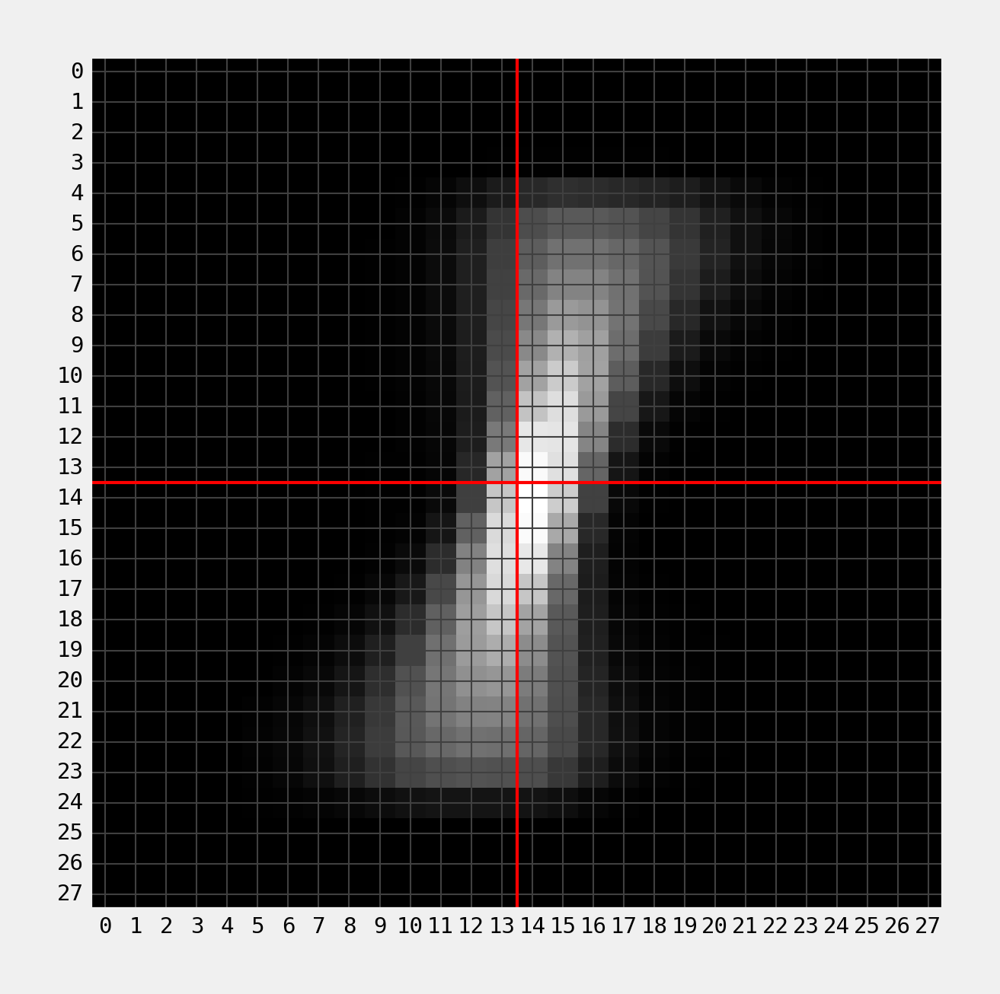

In [30]:
plotDigitLine(df1Avg[1:785], df1Avg[0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00e.png",  facecolor = "black")

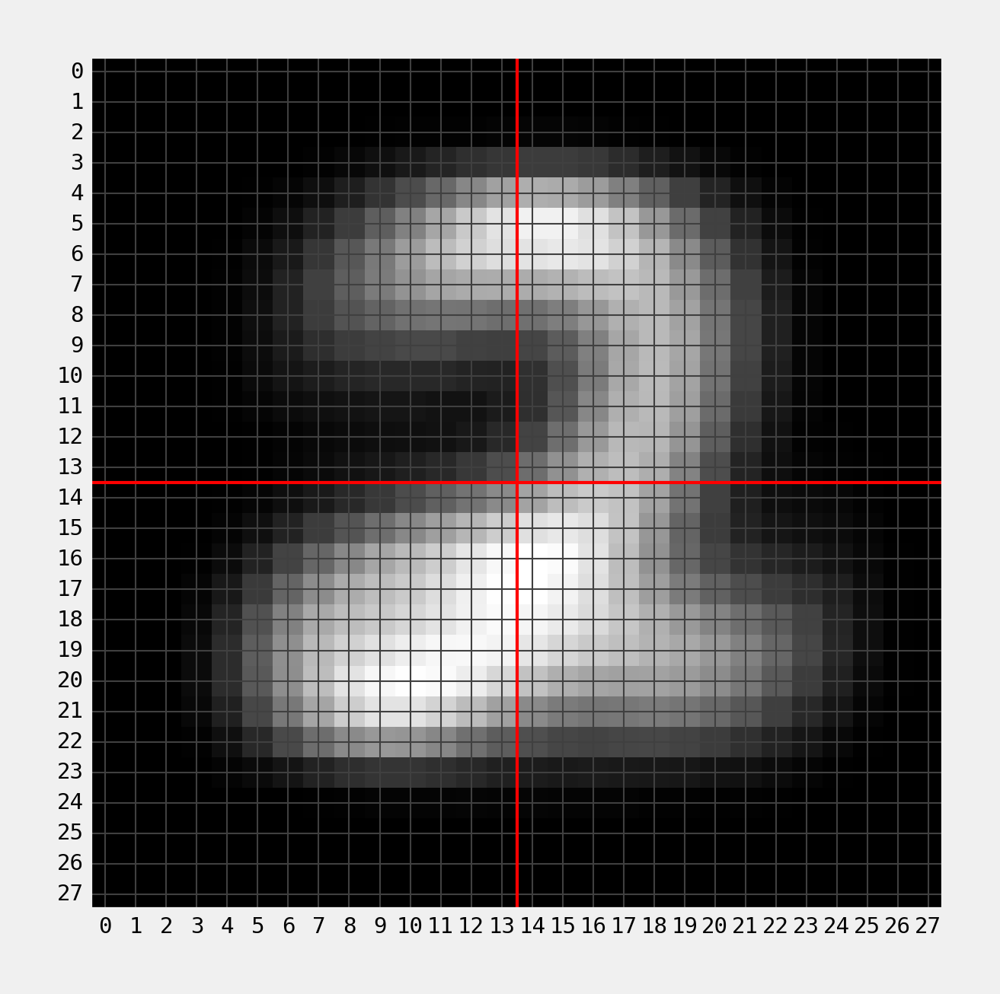

In [31]:
plotDigitLine(df2Avg[1:785], df2Avg[0])
plt.savefig("../presentations/strata-us/figures/fig_mnist_00f.png", facecolor = "black")

In [32]:
def plotSymmetry(arr1D, label):
    pixels = np.array(arr1D, dtype='uint8')
    pixels = pixels.reshape((28, 28))
    plotDigit(pixels, label)
    plt.show()
    pixelslr = np.fliplr(pixels)
    plotDigit(pixelslr, label)
    plt.show()
    plotDigit(np.abs(pixelslr - pixels), label)
    plt.show()
    pixelsud = np.flipud(pixels)
    plotDigit(pixelsud, label)
    plt.show()
    plotDigit(np.abs(pixelsud - pixels), label)
    plt.show()

## [0] Visualise the entire feature space

In [33]:
dftest12 = dftest[(dftest.num == 1) | (dftest.num == 2)].copy()
dftest12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x777,x778,x779,x780,x781,x782,x783,x784,intensity,symmetry
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.144308,0.090276
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.049375,0.085154
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.069303,0.092197
14,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.081027,0.122289
29,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.063966,0.128691


In [345]:
df12 = df[(df.num == 1) | (df.num == 2)].copy()
df12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x777,x778,x779,x780,x781,x782,x783,x784,intensity,symmetry
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.164601,0.090276
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.075895,0.059544
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.089421,0.056343
22,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.055102,0.043537
23,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0.133839,0.094758


In [346]:
df12.shape

(5234, 787)

In [347]:
# Font Settings
plt.rcParams['figure.figsize'] = (16, 9)
plt.rcParams['axes.labelpad'] = 5

In [348]:
color1 = (0.267004, 0.004874, 0.329415)
color2 = (0.95, 0.95, 0)
color3 = (0.657642, 0.860219, 0.203082)
datacolor = (0, 0, 0.75, 0.5)
predcolor = (0.75, 0, 0, 0.7)
predcolorzero = (0, 0, 0, 0)
colors = {1: color1, 2: color2}
colorsError = {0: predcolorzero, 1: predcolor}

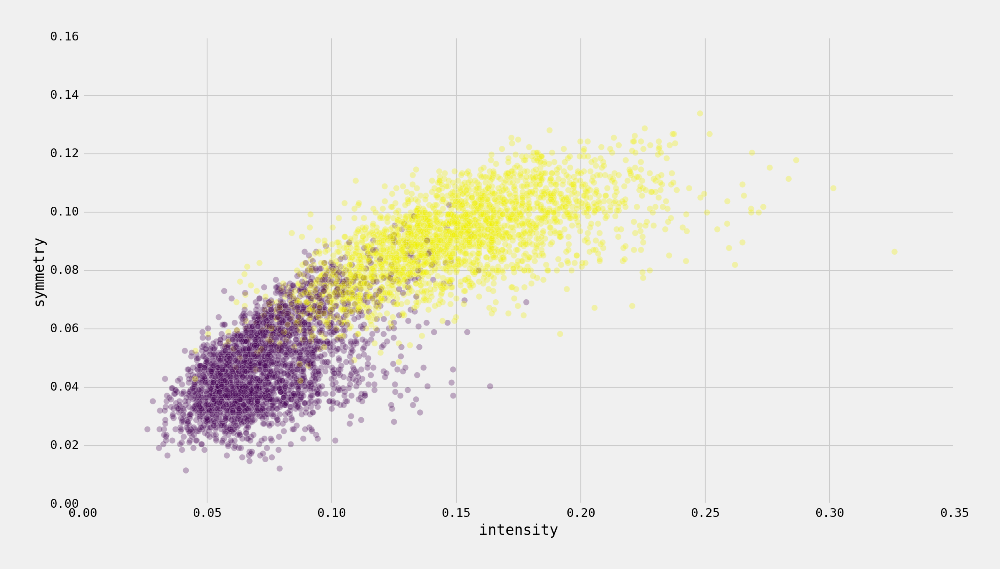

In [349]:
plt.scatter(df12.intensity, df12.symmetry, c = df12['num'].apply(lambda x: colors[x]), alpha = 0.3, s = 50)
plt.xlabel('intensity')
plt.ylabel('symmetry')
#plt.savefig("../presentations/strata-us/figures/fig_mnist_06.png")

In [350]:
# df12.plot(kind = 'scatter', x = 'intensity', y = 'symmetry', c = df12['num'].apply(lambda x: colors[x]), 
#          alpha = 0.3, s = 50, cmap = plt.cm.viridis)

## [1] Visualise the Prediction 

In [351]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn import discriminant_analysis
from sklearn import svm

In [352]:
df12.shape

(5234, 787)

In [395]:
dftest12Y = dftest12.ix[:.0]

In [396]:
dftest12X = dftest12.ix[:,785:787]

In [353]:
df12Y = df12.ix[:,0]

In [354]:
df12X = df12.ix[:,785:787]

In [355]:
modelLR1 = LogisticRegression(C = 10)

In [356]:
modelLR0 = LogisticRegression(C = 0.1)

In [357]:
modelLR2 = LogisticRegression(C = 100)

In [358]:
modelLR0.fit(df12X, df12Y)

LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [359]:
modelLR1.fit(df12X, df12Y)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [360]:
modelLR2.fit(df12X, df12Y)

LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [361]:
df12.loc[:, 'LRpred0'] = modelLR0.predict(df12X)
df12.loc[:, 'LRpred1'] = modelLR1.predict(df12X)
df12.loc[:, 'LRpred2'] = modelLR2.predict(df12X)

In [362]:
df12.loc[:, 'LRpred_prob0'] = modelLR0.predict_proba(df12X)[:,1]
df12.loc[:, 'LRpred_prob1'] = modelLR1.predict_proba(df12X)[:,1]
df12.loc[:, 'LRpred_prob2'] = modelLR2.predict_proba(df12X)[:,1]

In [397]:
dftest12.loc[:, 'LRpred1'] = modelLR1.predict(dftest12X)

In [398]:
dftest12.loc[:, 'LRpred_prob1'] = modelLR1.predict_proba(dftest12X)[:,1]

In [363]:
df12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x783,x784,intensity,symmetry,LRpred0,LRpred1,LRpred2,LRpred_prob0,LRpred_prob1,LRpred_prob2
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0.164601,0.090276,2,2,2,0.597320,0.970463,0.989078
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0.075895,0.059544,1,1,1,0.412616,0.140167,0.097961
10,1,0,0,0,0,0,0,0,0,0,...,0,0,0.089421,0.056343,1,1,1,0.432439,0.200356,0.129184
22,1,0,0,0,0,0,0,0,0,0,...,0,0,0.055102,0.043537,1,1,1,0.362417,0.029861,0.010019
23,2,0,0,0,0,0,0,0,0,0,...,0,0,0.133839,0.094758,2,2,2,0.549312,0.915285,0.971895


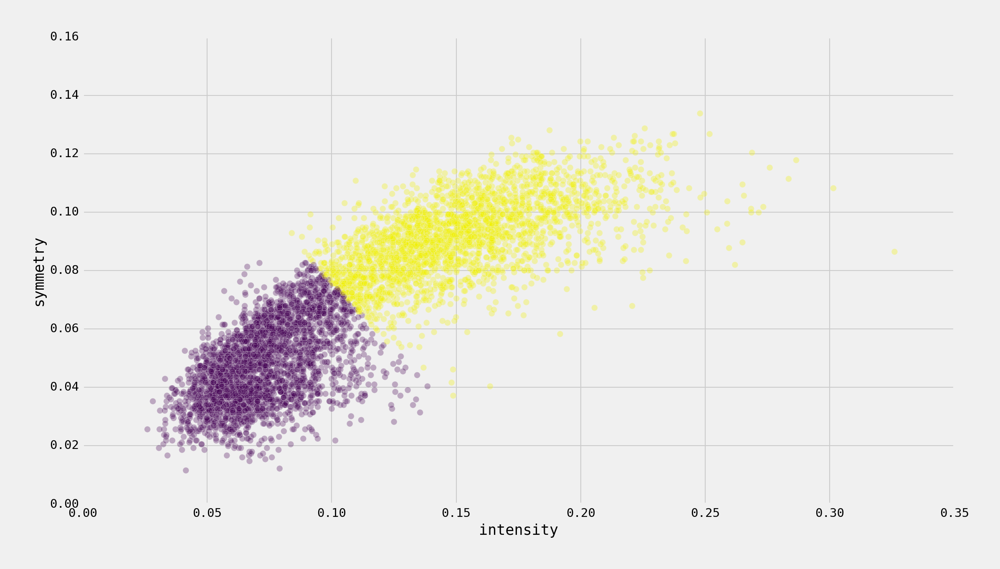

In [364]:
#df12.plot(kind = 'scatter', x = 'intensity', y = 'symmetry', c = df12.LRpred, 
#          alpha = 0.3, s = 50, cmap = plt.cm.viridis)

plt.scatter(df12.intensity, df12.symmetry, c = df12['LRpred1'].apply(lambda x: colors[x]), alpha = 0.3, s = 50)
plt.xlabel('intensity')
plt.ylabel('symmetry')
#plt.savefig("../presentations/strata-us/figures/fig_mnist_01.png")

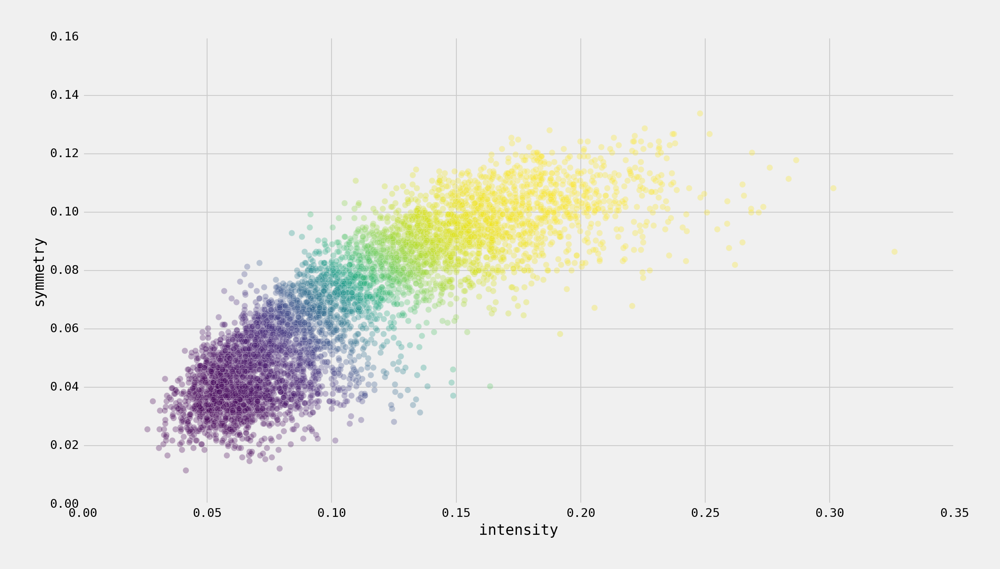

In [365]:
plt.scatter(df12.intensity, df12.symmetry, c = df12['LRpred_prob1'], alpha = 0.3, s = 50, cmap=plt.cm.viridis)
plt.xlabel('intensity')
plt.ylabel('symmetry')
plt.savefig("../presentations/strata-us/figures/fig_mnist_01a.png")

# Prediction Mesh

In [366]:
from pandas import DataFrame

In [367]:
mesh = DataFrame()
x_min, x_max = df.intensity.min() , df.intensity.max() 
x_step_size = (x_max - x_min)/100
y_min, y_max = df.symmetry.min() , df.symmetry.max() 
y_step_size = (y_max - y_min)/100
xx, yy = np.meshgrid(np.arange(x_min, x_max, x_step_size), np.arange(y_min, y_max, y_step_size))
mesh['xx'] = xx.ravel()
mesh['yy'] = yy.ravel()

In [368]:
mesh['LRpred_prob0'] = modelLR0.predict_proba(np.c_[mesh['xx'], mesh['yy']])[:, 1]
mesh['LRpred0'] = modelLR0.predict(np.c_[mesh['xx'], mesh['yy']])
mesh['LRpred_prob1'] = modelLR1.predict_proba(np.c_[mesh['xx'], mesh['yy']])[:, 1]
mesh['LRpred1'] = modelLR1.predict(np.c_[mesh['xx'], mesh['yy']])
mesh['LRpred_prob2'] = modelLR2.predict_proba(np.c_[mesh['xx'], mesh['yy']])[:, 1]
mesh['LRpred2'] = modelLR2.predict(np.c_[mesh['xx'], mesh['yy']])
print(mesh.shape)

(10000, 8)


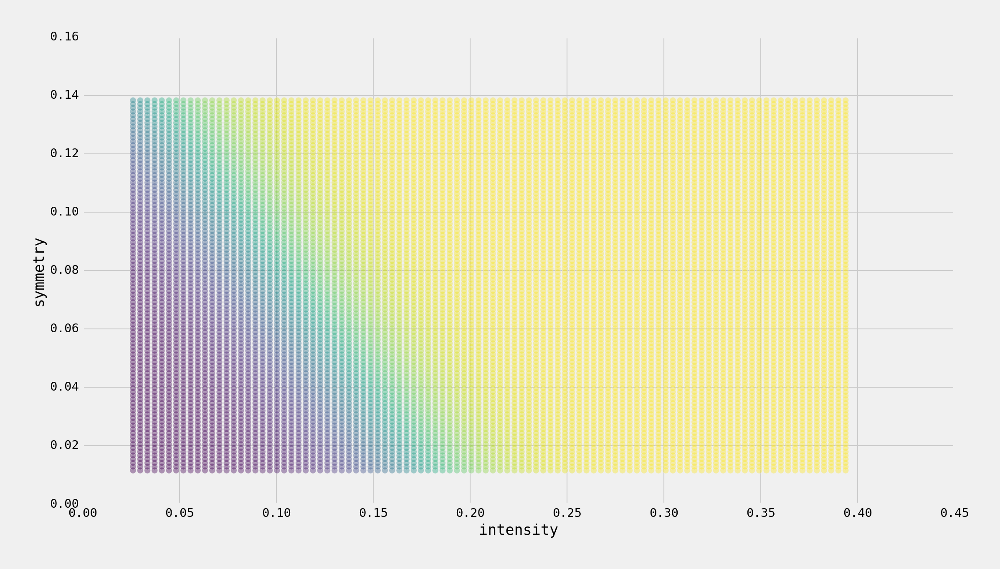

In [369]:
plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred_prob1'], alpha = 0.4, s = 50, cmap=plt.cm.viridis)
#plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred1'].apply(lambda x: colors[x]), alpha = 0.4, s = 50, cmap=plt.cm.viridis)
plt.xlabel('intensity')
plt.ylabel('symmetry')
#plt.savefig("../presentations/strata-us/figures/fig_mnist_01b.png")

## [2] Visualise the errors in model fitting

In [370]:
df12['LR_error0'] = np.abs(df12['num']- df12['LRpred0'])
df12['LR_error1'] = np.abs(df12['num']- df12['LRpred1'])
df12['LR_error2'] = np.abs(df12['num']- df12['LRpred2'])

In [399]:
dftest12['LR_error1'] = np.abs(dftest12['num']- dftest12['LRpred1'])


In [371]:
df12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,symmetry,LRpred0,LRpred1,LRpred2,LRpred_prob0,LRpred_prob1,LRpred_prob2,LR_error0,LR_error1,LR_error2
1,2,0,0,0,0,0,0,0,0,0,...,0.090276,2,2,2,0.597320,0.970463,0.989078,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0.059544,1,1,1,0.412616,0.140167,0.097961,0,0,0
10,1,0,0,0,0,0,0,0,0,0,...,0.056343,1,1,1,0.432439,0.200356,0.129184,0,0,0
22,1,0,0,0,0,0,0,0,0,0,...,0.043537,1,1,1,0.362417,0.029861,0.010019,0,0,0
23,2,0,0,0,0,0,0,0,0,0,...,0.094758,2,2,2,0.549312,0.915285,0.971895,0,0,0


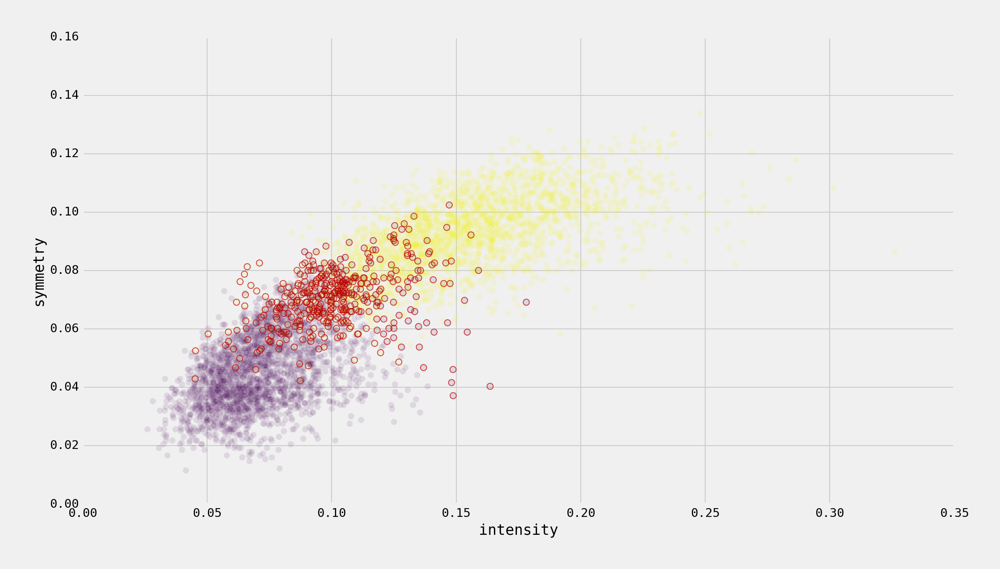

In [372]:
plt.scatter(df12.intensity, df12.symmetry, c = df12['num'].apply(lambda x: colors[x]), alpha = 0.1, s = 50)
plt.scatter(df12.intensity, df12.symmetry, facecolor="None", edgecolor=df12['LR_error1'].apply(lambda x: colorsError[x]),
            linewidth=1, s = 50)

plt.xlabel('intensity')
plt.ylabel('symmetry')
#plt.savefig("../presentations/strata-us/figures/fig_mnist_02.png")

# [3] With different input parameters

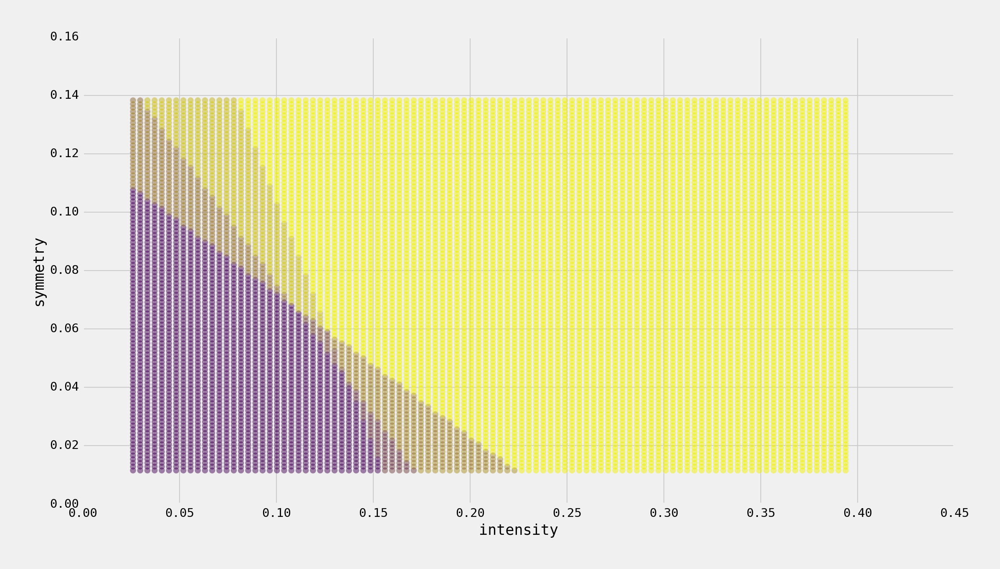

In [373]:
#plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred_prob0'], alpha = 0.4, s = 50, cmap=plt.cm.viridis)
#plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred_prob1'], alpha = 0.4, s = 50, cmap=plt.cm.viridis)
#plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred_prob2'], alpha = 0.4, s = 50, cmap=plt.cm.viridis)
plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred0'].apply(lambda x: colors[x]), alpha = 0.2, s = 50, cmap=plt.cm.viridis)
plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred1'].apply(lambda x: colors[x]), alpha = 0.2, s = 50, cmap=plt.cm.viridis)
plt.scatter(mesh.xx, mesh.yy, c = mesh['LRpred2'].apply(lambda x: colors[x]), alpha = 0.2, s = 50, cmap=plt.cm.viridis)
plt.xlabel('intensity')
plt.ylabel('symmetry')
#plt.savefig("../presentations/strata-us/figures/fig_mnist_03.png")

# With all features

In [374]:
df12Yall = df12.ix[:,0]

In [375]:
df12Xall = df12.ix[:,1:765]

In [376]:
df12Xall.head()

,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,...,x755,x756,x757,x758,x759,x760,x761,x762,x763,x764
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
22,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [377]:
modelLRall0 = LogisticRegression(C = 0.000000001)
modelLRall1 = LogisticRegression(C = 10)
modelLRall2 = LogisticRegression(C = 100)

In [378]:
modelLRall0.fit(df12Xall, df12Yall)
modelLRall1.fit(df12Xall, df12Yall)
modelLRall2.fit(df12Xall, df12Yall)

LogisticRegression(C=100, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [379]:
df12.loc[:, 'LRpredall0'] = modelLRall0.predict(df12Xall)
df12.loc[:, 'LRpredall1'] = modelLRall1.predict(df12Xall)
df12.loc[:, 'LRpredall2'] = modelLRall2.predict(df12Xall)

In [380]:
df12.loc[:, 'LRpred_proball0'] = modelLRall0.predict_proba(df12Xall)[:,1]
df12.loc[:, 'LRpred_proball1'] = modelLRall1.predict_proba(df12Xall)[:,1]
df12.loc[:, 'LRpred_proball2'] = modelLRall2.predict_proba(df12Xall)[:,1]

In [381]:
df12['LR_errorall0'] = np.abs(df12['num']- df12['LRpredall0'])
df12['LR_errorall1'] = np.abs(df12['num']- df12['LRpredall1'])
df12['LR_errorall2'] = np.abs(df12['num']- df12['LRpredall2'])

In [382]:
df12['LR_errorall0'].sum()

182

In [383]:
df12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,LR_error2,LRpredall0,LRpredall1,LRpredall2,LRpred_proball0,LRpred_proball1,LRpred_proball2,LR_errorall0,LR_errorall1,LR_errorall2
1,2,0,0,0,0,0,0,0,0,0,...,0,2,2,2,0.727694,1.000000e+00,1.000000e+00,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.387824,1.824031e-06,1.828765e-06,0,0,0
10,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.318330,2.113808e-12,2.123570e-12,0,0,0
22,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.483484,7.642549e-11,7.652299e-11,0,0,0
23,2,0,0,0,0,0,0,0,0,0,...,0,2,2,2,0.650904,1.000000e+00,1.000000e+00,0,0,0


In [384]:
from sklearn.manifold import TSNE

In [385]:
X = df12.ix[:, 1:785]

In [386]:
Y = df12.ix[:, 0:1]

In [387]:
Y.shape

(5234, 1)

In [388]:
df12.shape

(5234, 805)

In [389]:
model = TSNE(n_components=2, random_state=0)
vis = model.fit_transform(X)

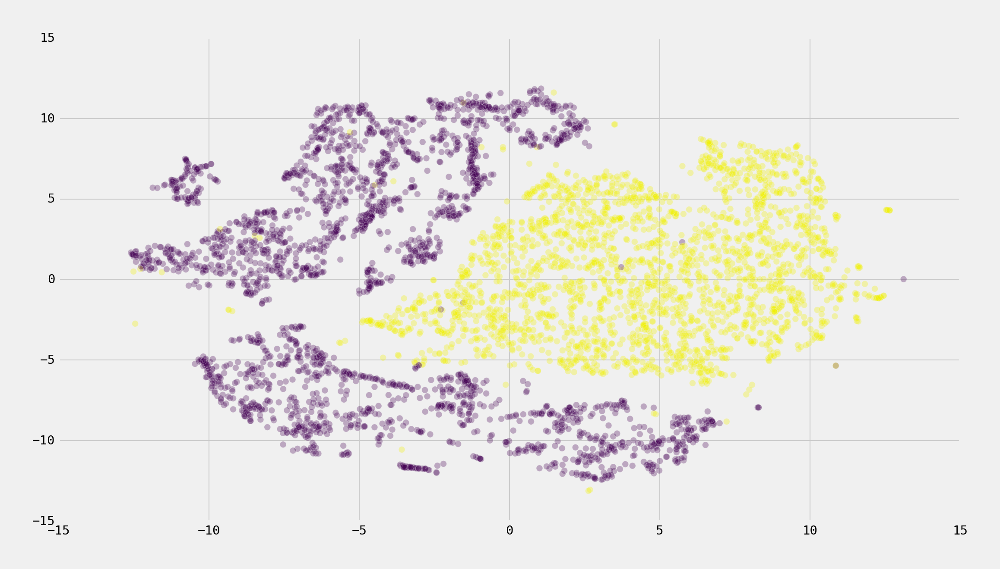

In [390]:
vis_x = vis[:, 0]
vis_y = vis[:, 1]

plt.scatter(vis_x, vis_y, c=df12['num'].apply(lambda x: colors[x]), s = 50, alpha = 0.3)
#plt.savefig("../presentations/strata-us/figures/fig_mnist_06a.png")

In [401]:
Xtest = dftest12.ix[:, 1:785]

In [402]:
vistest = model.fit_transform(Xtest)

In [403]:
vistest_x = vistest[:, 0]
vistest_y = vistest[:, 1]

In [391]:
df12.head()

,num,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,LR_error2,LRpredall0,LRpredall1,LRpredall2,LRpred_proball0,LRpred_proball1,LRpred_proball2,LR_errorall0,LR_errorall1,LR_errorall2
1,2,0,0,0,0,0,0,0,0,0,...,0,2,2,2,0.727694,1.000000e+00,1.000000e+00,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.387824,1.824031e-06,1.828765e-06,0,0,0
10,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.318330,2.113808e-12,2.123570e-12,0,0,0
22,1,0,0,0,0,0,0,0,0,0,...,0,1,1,1,0.483484,7.642549e-11,7.652299e-11,0,0,0
23,2,0,0,0,0,0,0,0,0,0,...,0,2,2,2,0.650904,1.000000e+00,1.000000e+00,0,0,0


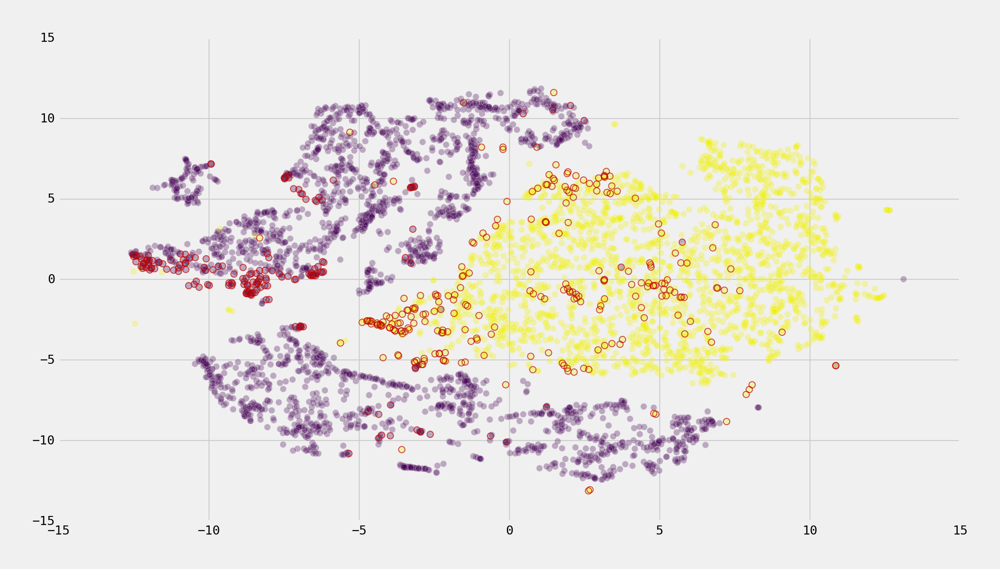

In [392]:
plt.scatter(vis_x, vis_y, c=df12['num'].apply(lambda x: colors[x]), s = 50, alpha = 0.3)
plt.scatter(vis_x, vis_y, facecolor="None", edgecolor=df12['LR_error1'].apply(lambda x: colorsError[x]),
            linewidth=1, s = 50)

#plt.savefig("../presentations/strata-us/figures/fig_mnist_02a.png")

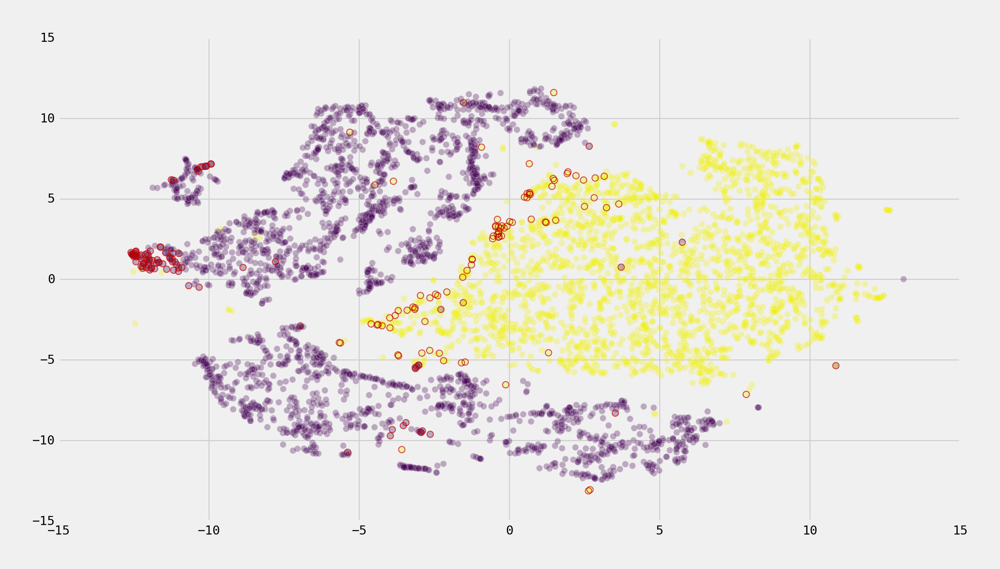

In [393]:
plt.scatter(vis_x, vis_y, c=df12['num'].apply(lambda x: colors[x]), s = 50, alpha = 0.3)
plt.scatter(vis_x, vis_y, facecolor="None", edgecolor=df12['LR_errorall0'].apply(lambda x: colorsError[x]),
            linewidth=1, s = 50)

#plt.savefig("../presentations/strata-us/figures/fig_mnist_02c.png")

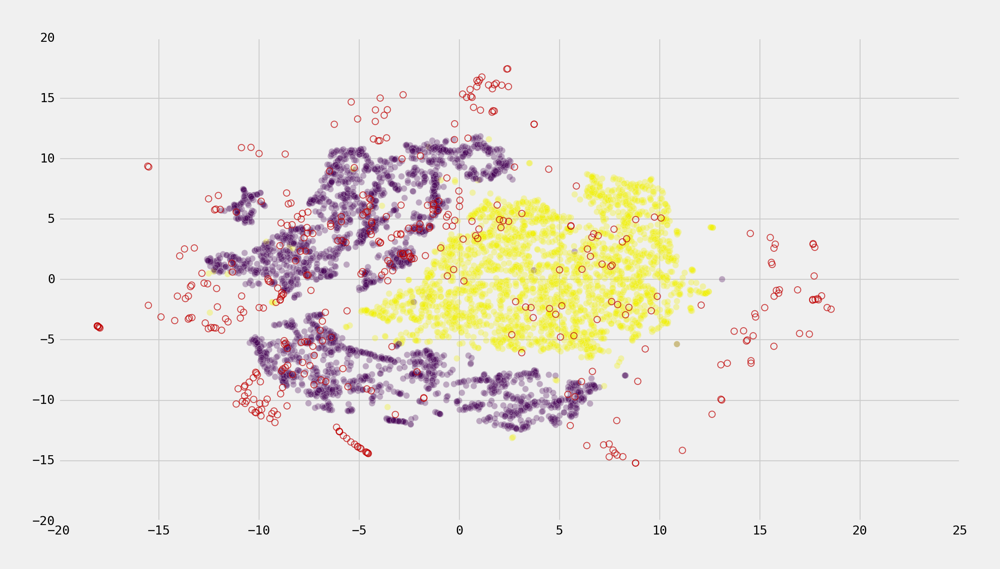

In [404]:
plt.scatter(vis_x, vis_y, c=df12['num'].apply(lambda x: colors[x]), s = 50, alpha = 0.3)
plt.scatter(vistest_x, vistest_y, facecolor="None", edgecolor=dftest12['LR_error1'].apply(lambda x: colorsError[x]),
            linewidth=1, s = 50)
